# Authorship

Adapted from
```
Bryan Lim, Sercan Ö. Arık, Nicolas Loeff, Tomas Pfister,
Temporal Fusion Transformers for interpretable multi-horizon time series forecasting,
International Journal of Forecasting,
Volume 37, Issue 4,
2021,
Pages 1748-1764,
ISSN 0169-2070,
https://doi.org/10.1016/j.ijforecast.2021.03.012.
(https://www.sciencedirect.com/science/article/pii/S0169207021000637)
```
Specifically the 2019 version: https://arxiv.org/abs/1912.09363

Using PyTorch Forecasting: https://pytorch-forecasting.readthedocs.io/en/stable/tutorials/stallion.html

And FastAI Autoencoder: https://course.fast.ai/Lessons/lesson15.html

Authored/Modified by: Tiago Zanaga Da Costa and Jason Belisario


# Changelog
### V 1.6:
* Created a function to Save AE weights.
 * Updates version of AE weights.
 * Creates new file with current weight.
* Created a function to Load AE weights.
 * Loads in a specified version of the AE weights. (V 0 set to default need to change that for any other versions).
* Modified function to Load Dataset to handle multiple datasets.
* Create a function to save col_def and dataset with AE values to GCloud
* Added line to remove EGR Growth Column from datasets.
* Updated the WandB instance to include Learning Rate, AE Outs Version, Baseline, Target, Encoder Length, Predicition Length.
* Edited epochs to 80 and early stop patience raised to 15 from 10 to train longer.
* New Values added to data: "Rent Per SqFt Submarket", "Rent Per SqFt Rating (Submarket)"

* 1341 Lines of code on the github

## Setup

### Package installation

In [ ]:
!pip install -U jupyter
!pip install google-cloud-storage --upgrade
!pip install gcsfs --upgrade
!pip install torch -f https://download.pytorch.org/whl/torch_stable.html.
!pip install pytorch-forecasting===0.8.1 #--upgrade #===0.6.1
!pip install pytorch-forecasting --upgrade
!pip install wandb --upgrade
!pip install tensorflow --upgrade

## V 1.6
!pip install fastparquet --upgrade
!pip install pyarrow --upgrade
!pip install python-snappy --upgrade

## V 1.7
!pip install pyro-ppl

### Import Utils

In [ ]:
# General use Utils
import os
import re
import warnings
from pathlib import Path
import copy
import gc
import json
from io import BytesIO

# Cloud storage Utils
from google.cloud import storage
import gcsfs

# Data manipulation Utils
import pandas as pd
import numpy as np

# Pytorch Utils
import torch
from torch import nn
import pytorch_forecasting
import pytorch_lightning as pl
## Forecasting Subutils
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer, Baseline
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import PoissonLoss, QuantileLoss, SMAPE
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
## Lightning Subutils
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.loggers import WandbLogger

# Misc ML Utils
import tensorflow
from tensorflow.python.lib.io import file_io

#Third party Services
import wandb

warnings.filterwarnings("ignore")

In [ ]:
!python --version
print("Pandas Version: ", pd.__version__)
print("Numpy Version: ", np.__version__)
print("Torch version: ", torch.__version__)
print("Pytorch Forecasting version: ", pytorch_forecasting.__version__)
print("Pytorch Lightning version: ", pl.__version__)
print("Tensorflow Version: ", tensorflow.__version__)
print("GCSFS Version: ", gcsfs.__version__)
# print("Storage Version: ", storage.__version__)
print("Weights and Bisases version: ", wandb.__version__)

Python 3.7.10
Pandas Version:  1.1.5
Numpy Version:  1.19.5
Torch version:  1.8.1+cu101
Pytorch Forecasting version:  0.8.4
Pytorch Lightning version:  1.2.6
Tensorflow Version:  2.4.1
GCSFS Version:  0.7.2
Weights and Bisases version:  0.10.24


### Data Download

In [ ]:
#### Replace with better, cleaner version

#os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = r'' # use when you have to mount drive explicitly
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = r'' #use when you don't
#os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = r'' # use with vm
os.environ['GOOGLE_CLOUD_PROJECT'] = ''

# Name of the bucket where Data is stored
my_bucket = 'scout-storage'

#Initiate storage client
storage_client = storage.Client()

#Get Bucket where Data is stored
bucket = storage_client.get_bucket(my_bucket)

project_id = ''
token_file = ''
fs = gcsfs.GCSFileSystem(project=project_id)

''' For getting a list of market parquet file paths:
For each file (Blob) in the data directory "markets_prefix" (markets_blobs)
add that file's path onto the vector "markets_path_list". '''
# The location path of the data
markets_prefix = "markets_final/"
# Get a list of the contents of the directory where the data is located
markets_blobs = bucket.list_blobs(prefix = markets_prefix, delimiter = '/')
# The vector where the path of the data will be stored for retrieval
markets_path_list = []
for blob in markets_blobs:
  #if '.csv' in blob.name:
  blob_path = 'gs://' + my_bucket + '/' + blob.name
  markets_path_list.append(blob_path)

# Remove the '.' path
markets_path_list.remove('gs://scout-storage/markets_final/')
# Remove the end file
markets_path_list.remove('gs://scout-storage/markets_final/scout.parquet')

'''
Get markets CSV names for grouping regions together later
'''

markets_csv_prefix = "market_fixed_csv/"
markets_csv_blobs = bucket.list_blobs(prefix = markets_csv_prefix, delimiter = '/')
markets_csv_path_list = []

for blob in markets_csv_blobs:
  #if '.csv' in blob.name:
  blob_path = 'gs://' + my_bucket + '/' + blob.name
  markets_csv_path_list.append(blob_path)
markets_csv_path_list.remove('gs://scout-storage/market_fixed_csv/')

## Create Dataset & Dataloaders

- Create target, date features, and time_idx
- define columns
- create pytorch dataloader

### Create Dataset, Apply Transformations, and Create Column Definitions
* Select and load market data
* Apply various transformations to dataset
* Create column definitions

#### Dataset

In [ ]:
regions = {
    'Alaska-Hawaii': ['Anchorage', 'Honolulu'],
    'Central California': ['Central Coast', 'Central Valley'],
    'Florida': ['Fort Lauderdale', 'Jacksonville', 'Miami', 'North Central Florida',
                'Orlando', 'Pensacola', 'Southwest Florida Coast', 'Tallahassee',
                'Tampa', 'West Palm Beach'],
    'Mid-Atlantic': ['Baltimore', 'Northern Virginia', 'Richmond-Tidewater',
                     'Washington DC - Suburban Maryland'],
    'Midwest': ['Chicago - Suburban', 'Chicago - Urban', 'Cincinnati', 'Cleveland-Akron',
                'Columbus', 'Dayton', 'Des Moines', 'Detroit', 'Fort Wayne', 'Grand Rapids',
                'Indianapolis', 'Kansas City', 'Lafayette', 'Lansing-Ann Arbor', 'Madison',
                'Milwaukee', 'Omaha', 'South Bend', 'St Louis', 'Toledo', 'Twin Cities - Suburban',
                'Twin Cities - Urban', 'Wichita'],
    'Northeast': ['Albany', 'Allentown-Bethlehem', 'Boston', 'Bridgeport-New Haven',
                  'Brooklyn', 'Buffalo', 'Harrisburg', 'Long Island', 'Manhattan',
                  'New Jersey - Central', 'New Jersey - Northern', 'Philadelphia - Suburban',
                  'Philadelphia - Urban', 'Pittsburgh', 'Portland ME', 'Providence',
                  'Queens', 'Rochester', 'Syracuse', 'White Plains', 'Worcester - Springfield'],
    'Northern California': ['Bay Area - East Bay', 'Bay Area - South Bay', 'Sacramento', 'San Francisco'],
    'Pacific Northwest': ['Eugene', 'Portland', 'Richland-Kennewick-Pasco', 'Seattle', 'Spokane', 'Tacoma'],
    'South': ['Baton Rouge', 'Birmingham', 'Chattanooga', 'Huntsville', 'Jackson', 'Knoxville',
              'Lafayette - Lake Charles', 'Lexington Fayette', 'Little Rock', 'Louisville',
              'Memphis', 'Mobile', 'Nashville', 'New Orleans'],
    'Southeast': ['Asheville', 'Atlanta - Suburban', 'Atlanta - Urban', 'Augusta GA', 'Charleston',
                  'Charlotte', 'Columbia', 'Columbus GA', 'Greenville', 'Macon', 'Raleigh - Durham',
                  'Savannah - Hilton Head', 'Wilmington', 'Winston-Salem-Greensboro'],
    'Southern California': ['Inland Empire', 'Los Angeles - Eastern County',
                            'Los Angeles - Metro', 'Orange County', 'San Diego',
                            'San Fernando Valley-Ventura County'],
    'Southwest': ['Amarillo', 'Austin', 'Central East Texas', 'Corpus Christi', 'Dallas - North',
                  'Dallas - Suburban', 'El Paso', 'Fort Worth', 'Houston - East', 'Houston - West',
                  'Lubbock', 'McAllen', 'Midland - Odessa', 'Oklahoma City', 'San Antonio', 'Tulsa'],
    'Western': ['Albuquerque', 'Boise', 'Colorado Springs', 'Denver', 'Las Vegas',
                'Phoenix', 'Reno', 'Salt Lake City', 'Tucson'],
}

Create new function called market_data & feed it the market that you want and return back the GCS link

Dallas, Fort Worth, Orlando, Atlanta.

In [ ]:
counter = 0
markets_idx = {}
for market in markets_csv_path_list:
  markets_idx[market[36:]] = 'gs://scout-storage/markets_final/market' + str(counter).zfill(3) + '.parquet'
  counter += 1

# return combined region df given region name & regions dict
def region_data(region_name, region_dict, start_slice, end_slice):

  markets = region_dict[region_name] # get list of markets in a region
  #cutoff to fix test with a couple markets at a time
  if start_slice == 0 and end_slice == 0:
    pass
  else:
    markets = markets[start_slice:end_slice]
  # return markets
  counter = 0

  for market in markets:
    print(market + " | " + markets_idx[market])
    if counter == 0:
      region_df = pd.read_parquet(markets_idx[market])
    else:
      market_df = pd.read_parquet(markets_idx[market]) # get each parquet file
      #region_df.concat(market_df)
      region_df = pd.concat([region_df, market_df], ignore_index=True)

    counter += 1
  try:
    del market_df
  except:
    pass

  return region_df

In [ ]:
def load_market_data(markets_list):

  '''Create a dict of market name & the correct file
    line up markets_csv_path_list (names) & markets_path_list (paths) in a dict'''

  markets_dict = {}
  for name, path in zip(markets_csv_path_list, markets_path_list):
    markets_dict[name[36:]] = path

  market_name_out = ""
  market_df_list = []
  i = 0
  # For every market_name in markets_list
  for market_name in markets_list:
    #do not fret about capitalization of market names
    # market_name = market_name.title()
    # Temp file to read in market at current iteration data to dataframe
    data = pd.read_parquet(markets_dict[market_name])
    # Add that dataframe to a list of dataframes
    # Modified currently to not get ALL columns and only SOME columns we care about
    market_df_list.append(data[["Date","property_id", "Rent Per SqFt Actual", "SUBMARKET_NAME", "MARKET_NAME", "PROPERTY_IMPRATING", "PROPERTY_LOCRATING"]])
    # market_df_list.append(data)

    # If not at the end of the list
    if (i != (len(markets_list)-1)):
      temp = market_name + '&&'
      market_name_out +=  temp
    # Else at the end of the list
    else:
      market_name_out += market_name
    # Update iterator
    i += 1

  ###   End of For Loop   ###
  # If the list passed in contained more than one markets
  if (i > 0):
    market_df = pd.concat(market_df_list)
  # Else the list passed in contained only one market
  else:
    market_df = market_df_list[0]

  # Clear up RAM by deleting the list containing the non-concatted datasets
  market_df_list = None
  del market_df_list
  return market_name_out, market_df

In [ ]:
def load_from_ranking(rank_df):
  subm = []
  rats = []

  submarkets_in = rankdf["SUBMARKET_NAME"]
  for sub in submarkets_in:
    raw = sub.split('_')
    subm.append([raw[0]])
    rats.append([raw[1]])

  markets = pd.unique(rankdf["MARKET_NAME"])
  market_name, data_in = load_market_data(markets)
  data_out = pd.DataFrame(col=data_in.columns)
  for i in range(len(raw)):
    print(subm[i], rats[i])
    filter = [subm[i], rats[i]]
    data_temp = data_in[(data_in.SUBMARKET == subm[i]) & (data_in.PROPERTY_IMPRATING == rats[i])]
    # data_temp = data_in.loc[(data_in["SUBMARKET" == subm[i]]) & (data_in["PROPERTY_IMPRATING" == rats[i]])]
    print(data_temp)
    data_out.concat(data_temp)

  print(data_out)
  return market_name, data_out


In [ ]:
%%time
# markets_list = ['Dallas - North', 'Dallas - Suburban', 'Fort Worth']
markets_list = regions["Florida"][0:] + regions["Southwest"][0:] + regions["Southeast"][0:]
# print(markets_list)
market_name_single = markets_list[0]

# market_name, data = load_market_data(markets_list)
rank_dir = "/content/scout_market_lists_SE_SW_FL_Submarkets_top20.csv"

rankdf = pd.read_csv(rank_dir)
market_name_single = rankdf["MARKET_NAME"]
market_name, data = load_from_ranking(rankdf)

data.columns = [x.replace('.', '') for x in data.columns]


In [ ]:
print(market_name)
# print(data.loc[data["property_id"] == "44_1000_48"])
data

Fort Lauderdale&&Jacksonville&&Miami&&North Central Florida&&Orlando&&Pensacola&&Southwest Florida Coast&&Tallahassee&&Tampa&&West Palm Beach&&Amarillo&&Austin&&Central East Texas&&Corpus Christi&&Dallas - North&&Dallas - Suburban&&El Paso&&Fort Worth&&Houston - East&&Houston - West&&Lubbock&&McAllen&&Midland - Odessa&&Oklahoma City&&San Antonio&&Tulsa&&Asheville&&Atlanta - Suburban&&Atlanta - Urban&&Augusta GA&&Charleston&&Charlotte&&Columbia&&Columbus GA&&Greenville&&Macon&&Raleigh - Durham&&Savannah - Hilton Head&&Wilmington&&Winston-Salem-Greensboro


,time_idx,Date,property_id,Rent Per SqFt Actual,Rent Per SqFt Market,SUBMARKET_NAME,MARKET_NAME,PROPERTY_IMPRATING,Year,Month,Week
116760,0,2010-01-01,101_1002_03,NaN,NaN,Daytona Beach - South,North Central Florida,C+,2010,1,53
117007,1,2010-02-01,101_1002_03,NaN,NaN,Daytona Beach - South,North Central Florida,C+,2010,2,5
117254,2,2010-03-01,101_1002_03,NaN,NaN,Daytona Beach - South,North Central Florida,C+,2010,3,9
117501,3,2010-04-01,101_1002_03,NaN,NaN,Daytona Beach - South,North Central Florida,C+,2010,4,13
117748,4,2010-05-01,101_1002_03,NaN,NaN,Daytona Beach - South,North Central Florida,C+,2010,5,17
...,...,...,...,...,...,...,...,...,...,...,...
1180596,115,2019-08-01,94_9_04,0.64,0.788,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,8,31
1181110,116,2019-09-01,94_9_04,0.64,0.788,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,9,35
1181624,117,2019-10-01,94_9_04,0.65,0.792,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,10,40
1182138,118,2019-11-01,94_9_04,0.65,0.790,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,11,44


In [ ]:
data = None
del data
gc.collect()

2242

#### Apply Transformations to Dataset

In [ ]:
# Extract features from date-time to capture trend/cyclical behavior as a function of time
def add_datepart(df, fldname, drop=True, time=False):
  "Helper function that adds columns relevant to a date."
  fld = df[fldname]
  fld_dtype = fld.dtype
  if isinstance(fld_dtype, pd.core.dtypes.dtypes.DatetimeTZDtype):
      fld_dtype = np.datetime64

  if not np.issubdtype(fld_dtype, np.datetime64):
      df[fldname] = fld = pd.to_datetime(fld, infer_datetime_format=True)
  targ_pre = re.sub('[Dd]ate$', '', fldname)
  attr = ['Year', 'Month', 'Week', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']
  if time: attr = attr + ['Hour', 'Minute', 'Second']
  for n in attr: df[targ_pre + n] = getattr(fld.dt, n.lower())
  df[targ_pre + 'Elapsed'] = fld.astype(np.int64) // 10 ** 9
  if drop: df.drop(fldname, axis=1, inplace=True)

# Remove January 2020 data
data = data[data['Date'] != pd.to_datetime('2020-01-01')]
# V1.6: Remove the egr_growth column
#data = data.drop(columns='egr_growth')
#
#data['Price_Per_Unit'] = data['Sales Amount']*1000000 // data['PROPERTY_UNITS']
#
data["time_idx"] = data["Date"].dt.year * 12 + data["Date"].dt.month
#
data["time_idx"] -= data["time_idx"].min()
#
add_datepart(data, 'Date', drop=False)
#
### data[['PROPERTY_ZIPCODE','CensusBlockGroup', 'TractCode', 'Month', 'Week', 'Year', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']] = data[['PROPERTY_ZIPCODE','CensusBlockGroup', 'TractCode', 'Month', 'Week', 'Year', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']].astype(str)
# Add the new calculated values for 'Rent Per SqFt Submarket' and 'Rent Per SqFt Rating (Submarket)'
# temp1 = (data[['time_idx', 'Rent Per SqFt Actual', 'PROPERTY_IMPRATING', 'SUBMARKET_NAME']].groupby(['time_idx', 'SUBMARKET_NAME', 'PROPERTY_IMPRATING']).mean().rename(columns = {'Rent Per SqFt Actual' : 'Rent Per SqFt Rating (Submarket)'}))
# temp2 = (data[['time_idx', 'Rent Per SqFt Actual', 'SUBMARKET_NAME']].groupby(['time_idx', 'SUBMARKET_NAME']).mean().rename(columns = {'Rent Per SqFt Actual' : 'Rent Per SqFt Submarket'}))
# data = pd.merge(data, temp1, on = ['SUBMARKET_NAME', 'time_idx', 'PROPERTY_IMPRATING'])
# data = pd.merge(data, temp2, on = ['SUBMARKET_NAME', 'time_idx'])
# temp1 = None
# temp2 = None
# del temp1, temp2
temp1 = (data[['time_idx', 'Rent Per SqFt Actual', 'PROPERTY_IMPRATING', 'SUBMARKET_NAME']].groupby(['SUBMARKET_NAME',  'time_idx', 'PROPERTY_IMPRATING']).mean().rename(columns = {'Rent Per SqFt Actual' : 'Rent Per SqFt Market'}))
# data = data.drop(columns=['Rent Per SqFt Market'])
data = pd.merge(data, temp1, on = ['SUBMARKET_NAME', 'time_idx', 'PROPERTY_IMPRATING'])
del temp1

'''
NaN Features: closing_costs, loan_payoff, LNCF, cost_of_sale, loan_payoff
Features we can probably drop: capex_reserves, CBDS (NOI - capex_reserves), UNCF,  (keeping loan proceeds), LECOC, UECOC (calculated incorrectly. CFBDS/equity)

Delete anything thats not dynamic (anything below NOI except debt payments)
'''
# data = data.drop(columns = ['closing_costs', 'loan_payoff', 'LNCF', 'cost_of_sale', 'loan_payoff', 'capex_reserves', 'CBDS', 'UNCF', 'LECOC', 'UECOC', 'StateFIPS','CountyFIPS', 'State', 'County'])
#
#data['NOI'] = data['EGR'] - ((data['Rent Actual'] * data['PROPERTY_UNITS']) * data['Expenses %'])
#
#data['Value'] = ((data['NOI']  * 12 / data['Market Cap Rate'])// data['PROPERTY_UNITS']) # rename to market price (based on cap rates )
#
#data['cap_rate'] = data['NOI'] / (data['Sales Amount']*1000000)
#
#data['OPEX'] = (data['Rent Actual'] * data['PROPERTY_UNITS']) * data['Expenses %']
#
cols = data.columns.tolist()
cols = cols[7:8] + cols[0:3] + cols[-1:] + cols[3:6] + cols[8:-1]
data =  data[cols]
data = data.drop(columns=["Is_quarter_start", "Is_year_end","Is_year_start","Elapsed"])
# market count in dataset
market_count = len(data['MARKET_NAME'].unique())
# property count in dataset
property_count = len(data['property_id'].unique())
data = data.sort_values(by=['property_id', 'time_idx'])

In [ ]:
print(data.columns)

Index(['time_idx', 'Date', 'property_id', 'Rent Per SqFt Actual',
       'Rent Per SqFt Market', 'SUBMARKET_NAME', 'MARKET_NAME',
       'PROPERTY_IMPRATING', 'Year', 'Month', 'Week'],
      dtype='object')


In [ ]:
# prop_ids = data['property_id'].unique()
# pct_change = pd.DataFrame(index=prop_ids, columns=['Average Pct Change'])
# for i in prop_ids:
#   temp = data.loc[data['property_id'] == i]
#   pct_change['Average Pct Change'][i] = temp['Rent Per SqFt Actual'].pct_change().mean()
# print(pct_change)

In [ ]:
# data1 = pd.DataFrame(columns=['time_idx', 'Date', 'Rent Per SqFt Actual', 'Rent Per SqFt Market', 'SUBMARKET_NAME', 'MARKET_NAME', 'PROPERTY_IMPRATING'])
# data1 = pd.merge(data1, data[['time_idx', 'Date', 'Rent Per SqFt Actual', 'Rent Per SqFt Market', 'SUBMARKET_NAME', 'MARKET_NAME', 'PROPERTY_IMPRATING']].groupby(['time_idx', 'SUBMARKET_NAME', 'PROPERTY_IMPRATING']), on=['time_idx', 'Date', 'Rent Per SqFt Actual', 'Rent Per SqFt Market', 'SUBMARKET_NAME', 'MARKET_NAME', 'PROPERTY_IMPRATING'])
temp2 = data[['time_idx', 'Date', 'Rent Per SqFt Actual', 'Rent Per SqFt Market', 'SUBMARKET_NAME', 'MARKET_NAME', 'PROPERTY_IMPRATING']].groupby(['time_idx', 'SUBMARKET_NAME', 'PROPERTY_IMPRATING'])
data1 = temp2.groups

In [ ]:
data1

{(0, 'Abercrombie', 'A-'): [384980, 384981, 384982, 384983], (0, 'Abercrombie', 'B'): [384539, 384540], (0, 'Abercrombie', 'B+'): [385072], (0, 'Abercrombie', 'B-'): [384420, 384421, 384422, 384423, 384424], (0, 'Abercrombie', 'C'): [384399, 384400], (0, 'Abercrombie', 'C+'): [384401, 384402, 384403, 384404, 384405, 384406, 384407, 384408], (0, 'Acworth / Kennesaw', 'A-'): [1303826, 1303827, 1303828, 1303829, 1303830, 1303831, 1303832, 1303833, 1303834, 1303835, 1303836, 1303837], (0, 'Acworth / Kennesaw', 'B'): [1303722, 1303723], (0, 'Acworth / Kennesaw', 'B+'): [1303603, 1303604, 1303605, 1303606, 1303607, 1303608, 1303609, 1303610, 1303611, 1303612], (0, 'Acworth / Kennesaw', 'C'): [1303849], (0, 'Acworth / Kennesaw', 'C+'): [1303579], (0, 'Addicks', 'A-'): [932519, 932520, 932521, 932522, 932523, 932524, 932525, 932526], (0, 'Addicks', 'B'): [932577, 932578, 932579, 932580, 932581, 932582, 932583, 932584, 932585, 932586, 932587], (0, 'Addicks', 'B+'): [932713, 932714, 932715, 9327

#### Column definitions

3879 census features - 3885 total features in static_reals

In [ ]:
def column_definitions(markets_df, target):
  '''Take in a market_df and output dictionary with column definitions'''

  feat_list = markets_df.columns.to_list()
  column_definitions = {}

  # Nothing is done with Date. Create new features before running this function.
  special_features = ['property_id', 'Date']

  time_idx= 'time_idx'
   # Value, Price_Per_Unit, Rent Per SqFt Actual, Rent Per SqFt Market
  group_ids = ['property_id']

  time_varying_known_reals = ['Elapsed', 'Year']
  time_varying_known_categoricals = ['Month', 'Week', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']

  #slice the market data list to keep only the census numerical features
  # census_features = feat_list[feat_list.index('B00001e1'):feat_list.index('B24080e21')+1]

  # static cols from property and market data.
  static_categoricals = ['MARKET_NAME', 'SUBMARKET_NAME',
                         'COUNTY_NAME', 'PROPERTY_NAME', 'PROPERTY_CITY',
                         'PROPERTY_STATE', 'PROPERTY_IMPRATING', 'PROPERTY_LOCRATING',
                         'PROPERTY_STUDENTHOUSING', 'PROPERTY_AFFORDABLEHOUSING',
                         'PROPERTY_MILITARYHOUSING', 'PROPERTY_AGERESTRICTED', 'PROPERTY_ZIPCODE',
                         'CensusBlockGroup', 'TractCode']



  # keep as real valued for now but later on make features of ranges to have cat vars of these feats
  static_reals = ['PROPERTY_UNITS', 'PROPERTY_SQFT', 'PROPERTY_ACRES', 'PROPERTY_DATECOMPLETED', 'PROPERTY_LATITUDE', 'PROPERTY_LONGITUDE']
  # Change 1.6: Took out Target so it goes into time_varying_unknown_reals instead
  not_time_varying_unknown_reals = special_features + static_categoricals + static_reals + time_varying_known_reals + time_varying_known_categoricals + [time_idx]

  time_varying_unknown_reals = [x for x in feat_list if x not in not_time_varying_unknown_reals]

  column_definitions['time_idx'] = time_idx
  column_definitions['target'] = target
  column_definitions['group_ids'] = group_ids
  column_definitions['static_categoricals'] = static_categoricals
  column_definitions['static_reals'] = static_reals
  column_definitions['time_varying_known_categoricals'] = time_varying_known_categoricals
  column_definitions['time_varying_known_reals'] = time_varying_known_reals
  column_definitions['time_varying_unknown_reals'] = time_varying_unknown_reals


  return column_definitions

In [ ]:
# Call the above function to create column definitions
# col_def = column_definitions(data)

#### Address NaN & inf

In [ ]:
'''fill all columns with real values with 0's for the nans
adding in either strings as nan to the cols with numbers
or adding number 0 to the column with strings. Must be uniform datatype'''
# data[col_def['time_varying_unknown_reals'] + [col_def['target']]] = data[col_def['time_varying_unknown_reals'] + [col_def['target']]].fillna(0)
# data[col_def['static_categoricals'] + col_def['time_varying_known_categoricals']] = data[col_def['static_categoricals'] + col_def['time_varying_known_categoricals']].fillna('NaN') #np.nan

'''change np.nan to 0 in the event that we get errors because Nan's exist in the dataset. Ideally we'd want model to ignore the inf values rather than learn from 0's'''
data.replace([np.inf, -np.inf], np.nan, inplace=True)
# Added this to check final data format
data

,time_idx,Date,property_id,Rent Per SqFt Actual,Rent Per SqFt Market,SUBMARKET_NAME,MARKET_NAME,PROPERTY_IMPRATING,Year,Month,Week
116760,0,2010-01-01,101_1002_03,0.00,0.000,Daytona Beach - South,North Central Florida,C+,2010,1,53
117007,1,2010-02-01,101_1002_03,0.00,0.000,Daytona Beach - South,North Central Florida,C+,2010,2,5
117254,2,2010-03-01,101_1002_03,0.00,0.000,Daytona Beach - South,North Central Florida,C+,2010,3,9
117501,3,2010-04-01,101_1002_03,0.00,0.000,Daytona Beach - South,North Central Florida,C+,2010,4,13
117748,4,2010-05-01,101_1002_03,0.00,0.000,Daytona Beach - South,North Central Florida,C+,2010,5,17
...,...,...,...,...,...,...,...,...,...,...,...
1180596,115,2019-08-01,94_9_04,0.64,0.788,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,8,31
1181110,116,2019-09-01,94_9_04,0.64,0.788,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,9,35
1181624,117,2019-10-01,94_9_04,0.65,0.792,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,10,40
1182138,118,2019-11-01,94_9_04,0.65,0.790,Oklahoma City - I 240 Corridor,Oklahoma City,B-,2019,11,44


## Scout Submarket Baseline

#### Create baseline and output final list to GCS

In [ ]:
data_actual = data.copy()
col_def_actual = column_definitions(data_actual, 'Rent Per SqFt Actual')

data_market = data.copy()
col_def_market = column_definitions(data_market, 'Rent Per SqFt Market')

In [ ]:
def percent_change(data, col_def):
  prop_ids = data['property_id'].unique()
  pct_change = pd.DataFrame(index=prop_ids, columns=['Average_Pct_Change'])#.reset_index()
  for id in prop_ids:
    temp = data.loc[data['property_id'] == id]
    pct_change['Average_Pct_Change'][id] = temp[col_def['target']].pct_change().mean()

  return pct_change

pct_change_actual = percent_change(data_actual, col_def_actual).reset_index().rename(columns = {'index': "property_id"})
pct_change_market = percent_change(data_market, col_def_market).reset_index().rename(columns = {'index': "property_id"})

In [ ]:
%%time
def baseline_data(data, pct_change_df, prediction_length, col_def, val=True):

  rent = col_def['target'].split()[-1] + "_rent" # Actual_Rent & Market_Rent
  data = data[['property_id', 'time_idx', col_def['target']]].rename(columns = {col_def['target']: rent})
  data = pd.merge(data, pct_change_df, how = 'outer') #join the pct_change of all prop id's
  prop_ids = data['property_id'].unique()
  temp_list = []

  if val:
    data = data[lambda x: x.time_idx <= x.time_idx.max() - prediction_length] # - prediction length when you want to validate
  else:
    data = data[lambda x: x.time_idx <= x.time_idx.max()]


  for id in prop_ids:
    temp = data[lambda x: x.property_id == id]
    counter = temp['time_idx'].max()
    time_idx_counter = temp['time_idx'].max() + 1
    for step in range(prediction_length):
      prev_rate_change = float(temp.loc[temp['time_idx'] == counter]['Average_Pct_Change']) #temp['Average_Pct_Change'][counter]
      prev_rent = float(temp.loc[temp['time_idx'] == counter][rent])#temp['rent'][counter]
      new_rent =  prev_rent + (prev_rent * prev_rate_change) # calculate the new rent
      temp = temp.append({'property_id': id, 'time_idx': time_idx_counter + step, rent: new_rent, 'Average_Pct_Change': prev_rate_change}, ignore_index=True)
      counter += 1

    temp_list.append(temp)

  return pd.concat(temp_list, ignore_index=True)#decoder_data.sort_values(by=['property_id', 'time_idx'])

prediction_length = 36
base_data_actual_val = baseline_data(data_actual, pct_change_actual, prediction_length, col_def_actual, val=True)
base_data_market_val = baseline_data(data_market, pct_change_market, prediction_length, col_def_market, val=True)

base_data_actual_pred = baseline_data(data_actual, pct_change_actual, prediction_length, col_def_actual, val=False)
base_data_market_pred = baseline_data(data_market, pct_change_market, prediction_length, col_def_market, val=False)

CPU times: user 6min 2s, sys: 150 ms, total: 6min 2s
Wall time: 6min 2s


In [ ]:
# actuals = np.asarray(data_actual.loc[data_actual['property_id'] == '24_3612_25'][col_def_actual['target']][-37:])
# predictions = np.asarray(base_data_actual_val.loc[base_data_actual_val['property_id'] == '24_3612_25']['rent'][-37:])
# MAE = abs((actuals - predictions)).mean() ; MAE

In [ ]:
# %%time
def baseline_error(baseline_data, data, col_def):
  prediction_length = 36
  prop_ids = data['property_id'].unique()
  rent = col_def['target'].split()[-1] + "_rent"
  error = col_def['target'].split()[-1] + "_error"
  mae_accum = []

  output = pd.DataFrame(index=prop_ids, columns=[error])

  for id in prop_ids:
    actuals = np.asarray(data.loc[data['property_id'] == id][col_def['target']][-prediction_length:])
    predictions = np.asarray(baseline_data.loc[baseline_data['property_id'] == id][rent][-prediction_length:])
    mae = abs((actuals - predictions)).mean()
    mae_accum.append(mae)
    output[error][id] = mae

  final_mae = statistics.mean([x for x in mae_accum if x > -10 and x < 10]) # 10's are there to get rid of any inf and nan in list

  return output, final_mae

actual_error_df, actual_error = baseline_error(base_data_actual_val, data_actual, col_def_actual)
market_error_df, market_error = baseline_error(base_data_market_val, data_market, col_def_market)

print("Actuals MAE: {}".format(actual_error))
print("Market MAE: {}".format(market_error))

Actuals MAE: 0.058424094655338564
Market MAE: 0.03548651075890007


In [ ]:
%%time
def baseline_output(base_data_actual, base_data_market, col_def_actual, col_def_market, actual_error_df, market_error_df):
  prediction_length = 36
  prop_ids = base_data_actual['property_id'].unique()
  actual_rent = col_def_actual['target'].split()[-1] + "_rent"
  market_rent = col_def_market['target'].split()[-1] + "_rent"

  output = pd.DataFrame(index=prop_ids, columns=['Mean_Diff'])

  for id in prop_ids:
    actual_preds = np.asarray(base_data_actual.loc[base_data_actual['property_id'] == id][actual_rent][-prediction_length:]) # get last n months of data
    market_preds = np.asarray(base_data_market.loc[base_data_market['property_id'] == id][market_rent][-prediction_length:])
    output['Mean_Diff'][id] = (market_preds - actual_preds).mean()

  output = reduce(lambda x, y: pd.merge(x, y,how = 'outer', left_index=True, right_index=True), [output, actual_error_df, market_error_df])

  return output

base_out = baseline_output(base_data_actual_pred, base_data_market_pred, col_def_actual, col_def_market, actual_error_df, market_error_df)

CPU times: user 7.34 s, sys: 0 ns, total: 7.34 s
Wall time: 7.34 s


In [ ]:
# markets = ['Dallas - North', 'Dallas - Suburban', 'Fort Worth']
markets = [market_name]
def property_data(markets):

  features = ['property_id','PROPERTY_DATECOMPLETED','PROPERTY_UNITS', 'MARKET_NAME','SUBMARKET_NAME', 'PROPERTY_LATITUDE', 'PROPERTY_LONGITUDE', 'PROPERTY_IMPRATING', 'PROPERTY_LOCRATING']
  counter = 0
  for market in markets:
    if counter == 0:
      prop_data = pd.read_csv('gs://scout-storage/market_fixed_csv/' + market)[features].drop_duplicates()
    else:
      market_df = pd.read_csv('gs://scout-storage/market_fixed_csv/' + market)[features].drop_duplicates()
      #region_df.concat(market_df)
      prop_data = pd.concat([prop_data, market_df], ignore_index=True)

    counter += 1
    try:
      del market_df
    except:
      pass

  return prop_data

prop_data = property_data(markets)

In [ ]:
base_final = base_out.reset_index().rename(columns = {'index':'property_id'})
base_final = pd.merge(base_final, prop_data, on = 'property_id')
base_final = pd.merge(base_final, data_actual[['property_id', 'Price_Per_Unit']].loc[data_actual['time_idx'] == 119], on = 'property_id') # marge last kown price per unit

In [ ]:
base_final = (base_final.loc[(base_final['Actual_error'] < 0.05) &
                (base_final['Market_error'] < 0.05) &
                (base_final['PROPERTY_DATECOMPLETED'] < 2000) &
                (base_final['PROPERTY_UNITS'] > 150) &
                (base_final['Mean_Diff'] > 0) &
                ((base_final['SUBMARKET_NAME'] == 'Marietta NE') |
                (base_final['SUBMARKET_NAME'] == 'Marietta SW'))
                ].sort_values(by=['Mean_Diff'], ascending=False, na_position='last'))

# output this to CSV in GCS - final list
base_final.to_csv('gs://scout-storage/scout_market_lists/'+ market_name + '_Marietta_150+.csv', index=False)

#### Baseline List and Graphs

In [ ]:
def market_rent_delta(mean_diff):
  market_sf = data_actual['Rent Actual'].mean() / data_actual['Rent Per SqFt Actual'].mean()
  print("Average size unit in market: {0:0.0f} SF".format(market_sf))
  print("Chunk rent delta in market: ${0:0.2f}".format(market_sf * mean_diff))

market_rent_delta(0.150332)

Average size unit in market: 1017 SF
Chunk rent delta in market: $152.91


In [ ]:
# single_out = base_final.sort_values(by=['Mean_Diff'], ascending=False, na_position='last').reset_index()
# single_out.loc[single_out['property_id'] == '24_3612_25']

,index,property_id,Mean_Diff,Actual_error,Market_error,PROPERTY_DATECOMPLETED,PROPERTY_UNITS,MARKET_NAME,SUBMARKET_NAME,PROPERTY_LATITUDE,PROPERTY_LONGITUDE,PROPERTY_IMPRATING,PROPERTY_LOCRATING
543,270,24_3612_25,-0.238161,0.0320713,0.0100665,1985,170,Atlanta - Suburban,Marietta SW,33.932277,-84.558756,B,B


In [ ]:
base_final.loc[(base_final['Actual_error'] < 0.05) &
                (base_final['Market_error'] < 0.05) &
                (base_final['PROPERTY_DATECOMPLETED'] < 2000) &
                (base_final['PROPERTY_UNITS'] > 150) &
                (base_final['Mean_Diff'] > 0) &
                ((base_final['SUBMARKET_NAME'] == 'Marietta NE') |
                (base_final['SUBMARKET_NAME'] == 'Marietta SW'))
                ].sort_values(by=['Mean_Diff'], ascending=False, na_position='last')

,property_id,Mean_Diff,Actual_error,Market_error,PROPERTY_DATECOMPLETED,PROPERTY_UNITS,MARKET_NAME,SUBMARKET_NAME,PROPERTY_LATITUDE,PROPERTY_LONGITUDE,PROPERTY_IMPRATING,PROPERTY_LOCRATING,Price_Per_Unit
126,24_2470_04,0.271275,0.036298,0.0175727,1972,280,Atlanta - Suburban,Marietta NE,33.978483,-84.527642,B,A-,46785.0
190,24_2974_04,0.248842,0.026181,0.0175727,1985,152,Atlanta - Suburban,Marietta NE,33.955330,-84.499090,B,B+,42763.0
284,24_372_04,0.225943,0.0361392,0.0312813,1975,454,Atlanta - Suburban,Marietta NE,33.959645,-84.500436,B+,B+,43127.0
325,24_3971_25,0.182989,0.0274044,0.0295739,1969,181,Atlanta - Suburban,Marietta SW,33.934838,-84.502865,B+,B-,24585.0
344,24_4207_25,0.150332,0.0401264,0.0100665,1984,378,Atlanta - Suburban,Marietta SW,33.932943,-84.504331,B,B-,47619.0
467,24_5230_25,0.135948,0.0304093,0.0100665,1980,192,Atlanta - Suburban,Marietta SW,33.931957,-84.502636,B,B-,50000.0
182,24_2895_25,0.124907,0.0318469,0.0100665,1969,152,Atlanta - Suburban,Marietta SW,33.906434,-84.538665,B,C+,31315.0
67,24_2065_25,0.0643428,0.0421664,0.024921,1988,494,Atlanta - Suburban,Marietta SW,33.929209,-84.505956,A-,B-,67510.0
402,24_4589_25,0.0523508,0.0200622,0.0319436,1964,192,Atlanta - Suburban,Marietta SW,33.905002,-84.527498,C+,C+,NaN
394,24_4489_25,0.0300908,0.0304649,0.0100665,1992,210,Atlanta - Suburban,Marietta SW,33.920529,-84.576059,B,B,60238.0


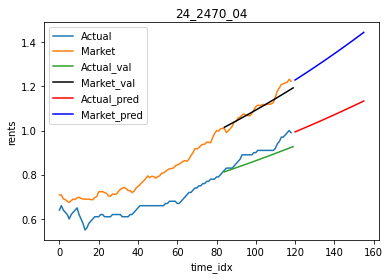

In [ ]:
prop_id = '24_2470_04'

# line 1 points
x1 = base_data_actual_pred.loc[(base_data_actual_pred['property_id'] == prop_id) & (base_data_actual_pred['time_idx'] < 119)]['time_idx'].to_list()
y1 = base_data_actual_pred.loc[(base_data_actual_pred['property_id'] == prop_id) & (base_data_actual_pred['time_idx'] < 119)]['Actual_rent'].to_list()
# plotting the line 1 points
plt.plot(x1, y1, label = "Actual")

x2 = base_data_market_pred.loc[(base_data_market_pred['property_id'] == prop_id) & (base_data_market_pred['time_idx'] < 119)]['time_idx'].to_list()
y2 = base_data_market_pred.loc[(base_data_market_pred['property_id'] == prop_id) & (base_data_market_pred['time_idx'] < 119)]['Market_rent'].to_list()
plt.plot(x2, y2, label = "Market")

x3 = base_data_actual_val.loc[(base_data_actual_val['property_id'] == prop_id) & (base_data_actual_val['time_idx'] > 119-36)]['time_idx'].to_list()
y3 = base_data_actual_val.loc[(base_data_actual_val['property_id'] == prop_id) & (base_data_actual_val['time_idx'] > 119-36)]['Actual_rent'].to_list()
plt.plot(x3, y3, label = "Actual_val")

x4 = base_data_market_val.loc[(base_data_market_val['property_id'] == prop_id) & (base_data_market_val['time_idx'] > 119-36)]['time_idx'].to_list()
y4 = base_data_market_val.loc[(base_data_market_val['property_id'] == prop_id) & (base_data_market_val['time_idx'] > 119-36)]['Market_rent'].to_list()
plt.plot(x4, y4, label = "Market_val", color = 'black')

x5 = base_data_actual_pred.loc[(base_data_actual_pred['property_id'] == prop_id) & (base_data_actual_pred['time_idx'] > 155-36)]['time_idx'].to_list()
y6 = base_data_actual_pred.loc[(base_data_actual_pred['property_id'] == prop_id) & (base_data_actual_pred['time_idx'] > 155-36)]['Actual_rent'].to_list()
plt.plot(x5, y6, label = "Actual_pred", color='red')

x7 = base_data_market_pred.loc[(base_data_market_pred['property_id'] == prop_id) & (base_data_market_pred['time_idx'] > 155-36)]['time_idx'].to_list()
y8 = base_data_market_pred.loc[(base_data_market_pred['property_id'] == prop_id) & (base_data_market_pred['time_idx'] > 155-36)]['Market_rent'].to_list()
plt.plot(x7, y8, label = "Market_pred", color = 'blue')

plt.xlabel('time_idx') # label x axis
plt.ylabel('rents') # label y axis
plt.title(prop_id) # graph title
plt.legend() # legend on the plot
plt.show() # show the plot

##  Autoencoder (Dimensionality Reduction)
1. encoder learns the data representation in lower-dimension space (extracting most salient features of the data.
2. decoder learns to reconstruct the original data base don the learned representation by the encoder.

*Current objective with my current level of understanding*:   
*   train the AE & get minimal reconstruction loss (MSE in this case).
*   somehow extract the data from that middle hidden layer and input it into TFT.
*   I need "Z"

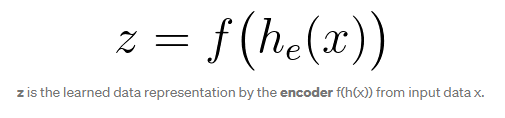



### FastAI Autoencoder

#### Setup

In [ ]:
#! [ -e /content ] && pip install -Uqq fastai  # upgrade fastai on colab

In [ ]:
# hide the outputs of the cell
%%capture
!pip install fastai --upgrade

In [ ]:
from fastai.torch_basics import *
from fastai.data.all import *
from fastai.tabular.all import *

In [ ]:
ae_data = data[col_def['static_reals'] + col_def['static_categoricals']]
#ae_data = data[col_def['time_varying_known_categoricals'] + col_def['time_varying_unknown_reals']]

In [ ]:
data = None
del data

In [ ]:
# static
cat_names = col_def['static_categoricals']
cont_names = col_def['static_reals']

# time - varying
# cat_names = col_def['time_varying_known_categoricals']
# cont_names = col_def['time_varying_unknown_reals']

new_dims = 128 # reduce dimensionality to this

procs = [Categorify, FillMissing, Normalize]
#y_names = 'B00001e1'
y_block = CategoryBlock()
splits = RandomSplitter()(range_of(ae_data))

#### Baseline accuracy

In [ ]:
# %%time
# to = TabularPandas(data, procs = [Categorify, FillMissing, Normalize], cat_names=cat_names, cont_names=cont_names,
#                    splits=splits, y_names=[y_names], y_block=CategoryBlock())

In [ ]:
# dls = to.dataloaders(bs=1024)

In [ ]:
# learn = tabular_learner(dls, layers=[50,10], metrics=[accuracy])
# learn.fit(5, 1e-3)

#### ReadTabBatchIdentity
`fastai` normally has `ReadTabBatch` as an `ItemTransform` in order to load in the outputs from a `TabularPandas` object. We need to modify this slightly, so instead of returning `x,y`, we return pairs of `x,x`:

In [ ]:
class ReadTabBatchIdentity(ItemTransform):
    "Read a batch of data and return the inputs as both `x` and `y`"
    def __init__(self, to): store_attr()

    def encodes(self, to):
        if not to.with_cont: res = (tensor(to.cats).long(),) + (tensor(to.cats).long(),)
        else: res = (tensor(to.cats).long(),tensor(to.conts).float()) + (tensor(to.cats).long(), tensor(to.conts).float())
        if to.device is not None: res = to_device(res, to.device)
        return res

class TabularPandasIdentity(TabularPandas): pass

#### TabDataLoaderIdentity

Next we need a way to use our new transform, and that is through a new `DataLoader`:

In [ ]:
@delegates()
class TabDataLoaderIdentity(TabDataLoader):
    "A transformed `DataLoader` for AutoEncoder problems with Tabular data"
    do_item = noops
    def __init__(self, dataset, bs=16, shuffle=False, after_batch=None, num_workers=0, **kwargs):
        if after_batch is None: after_batch = L(TransformBlock().batch_tfms)+ReadTabBatchIdentity(dataset)
        super().__init__(dataset, bs=bs, shuffle=shuffle, after_batch=after_batch, num_workers=num_workers, **kwargs)

    def create_batch(self, b): return self.dataset.iloc[b]

We also need to make `TabularPandasIdentity`'s `dl_type` to `TabDataLoaderIdentity` so it knows just what type of `DataLoader` to generate:

In [ ]:
TabularPandasIdentity._dl_type = TabDataLoaderIdentity

##### Building the `TabularPandasIdentity`

Now we can build our `to` object and the `DataLoaders`:

In [ ]:
%%time
to = TabularPandasIdentity(ae_data, [Categorify, FillMissing, Normalize], cat_names, cont_names, splits=RandomSplitter(seed=32)(ae_data))
#to = TabularPandasIdentity(ae_data, [Categorify, FillMissing, Normalize], cont_names=cont_names, splits=RandomSplitter(seed=32)(ae_data))
dls = to.dataloaders(bs=1024)

Could not do one pass in your dataloader, there is something wrong in it
CPU times: user 8min 7s, sys: 28.1 s, total: 8min 35s
Wall time: 8min 34s


We'll set the `n_inp` to 2 and then work on building our loss function:

`n_inp` is the number of elements in the tuples that should be considered part of the input and will default to 1 if tfms consists of one set of transforms, len(tfms)-1 otherwise.

In [ ]:
dls.n_inp = 2

#### Building the Loss Function

Probably the most important part of this problem is creating a good loss function that can best measure how accurate our model could recreate the data. Let's look at how to approach this with categorical and continuous variables

For the categorical variables, we'll want to gather a dictionary of each unique possible class in it:

In [ ]:
total_cats = {k:len(v) for k,v in to.classes.items()}
total_cats

{'MARKET_NAME': 2,
 'SUBMARKET_NAME': 62,
 'COUNTY_NAME': 6,
 'PROPERTY_NAME': 656,
 'PROPERTY_CITY': 46,
 'PROPERTY_STATE': 2,
 'PROPERTY_IMPRATING': 11,
 'PROPERTY_LOCRATING': 10,
 'PROPERTY_STUDENTHOUSING': 4,
 'PROPERTY_AFFORDABLEHOUSING': 4,
 'PROPERTY_MILITARYHOUSING': 3,
 'PROPERTY_AGERESTRICTED': 5,
 'PROPERTY_ZIPCODE': 120,
 'CensusBlockGroup': 468,
 'TractCode': 337}

We will then use this dictionary to figure out where to apply our `CrossEntropyLossFlat` for each categorical variable.

We'll also need to know the total number of outputs possible for those variables:

In [ ]:
sum([v for k,v in total_cats.items()])

1736

For the continuous variables we need to know the means and standard deviations:

We're going to store the `means` and `stds` in a `DataFrame` to make some further adjustments before usage:

In [ ]:
means = pd.DataFrame.from_dict({k:[v] for k,v in to.means.items()})
stds = pd.DataFrame.from_dict({k:[v] for k,v in to.stds.items()})

That modification we will be making is gathering a sigmoid range based on the non-normalized data to reduce the range our values can be:

In [ ]:
low = (ae_data[cont_names].min().to_frame().T.values - means.values) / stds.values
high = (ae_data[cont_names].max().to_frame().T.values - means.values) / stds.values

In [ ]:
low, high

(array([[-1.49266888, -1.47124207, -1.47819968, ..., -2.48092122,
         -2.24339573, -1.39991919]]),
 array([[6.29441632, 7.34809922, 4.43935757, ..., 2.15178779, 4.1188317 ,
         3.62334945]]))

#### ReconstructionLoss

Next we'll make our loss function. As mentioned, this loss function will run `MSELossFlat` on the continuous variables to measure accuracy and run `CrossEntropyLossFlat` for the categoricals:

In [ ]:
class ReconstructionLoss(Module):
    "Measures how well we have created the original tabular inputs"
    def __init__(self, cat_dict):
        ce = CrossEntropyLossFlat(reduction='sum')
        mse = MSELossFlat(reduction='sum')
        store_attr('cat_dict,ce,mse')

    def forward(self, preds, cat_targs, cont_targs):
        cats, conts = preds
        tot_ce, pos = cats.new([0]), 0
        for i, (k,v) in enumerate(self.cat_dict.items()):
            tot_ce += self.ce(cats[:, pos:pos+v], cat_targs[:,i])
            pos += v

        norm_cats = cats.new([len(self.cat_dict)])
        norm_conts = conts.new([conts.size(1)])
        cat_loss = tot_ce/norm_cats
        cont_loss = self.mse(conts, cont_targs)/norm_conts
        total = cat_loss+cont_loss

        return total / cats.size(0)

In [ ]:
loss_func = ReconstructionLoss(total_cats)

#### AE Model

Next we'll work on building the model we showed earlier. First we need our `BatchSwapNoise` module:

it is like Dropout, where the noise is only added during training

In [ ]:
class BatchSwapNoise(Module):
    "Swap Noise Module"
    def __init__(self, p): store_attr()

    def forward(self, x):
      if self.training:
          mask = torch.rand(x.size()) > (1 - self.p)
          l1 = torch.floor(torch.rand(x.size()) * x.size(0)).type(torch.LongTensor)
          l2 = (mask.type(torch.LongTensor) * x.size(1))
          res = (l1 * l2).view(-1)
          idx = torch.arange(x.nelement()) + res
          idx[idx>=x.nelement()] = idx[idx>=x.nelement()]-x.nelement()
          return x.flatten()[idx].view(x.size())
      else:
          return x

Next we'll make a custom `TabularAE` model (AutoEncoder) for us to use:

In [ ]:
class TabularAE(TabularModel):
  "A simple AutoEncoder model"
  def __init__(self, emb_szs, n_cont, hidden_size, cats, low, high, ps=0.2, embed_p=0.01, bswap=None):
      super().__init__(emb_szs, n_cont, layers=[1024, 512, 256], out_sz=hidden_size, embed_p=embed_p, act_cls=Mish())

      self.bswap = bswap
      self.cats = cats
      self.activation_cats = sum([v for k,v in cats.items()])

      self.layers = nn.Sequential(*L(self.layers.children())[:-1] + nn.Sequential(LinBnDrop(256, hidden_size, p=ps, act=Mish())))

      if(bswap != None): self.noise = BatchSwapNoise(bswap)
      self.decoder = nn.Sequential(
          LinBnDrop(hidden_size, 256, p=ps, act=Mish()),
          LinBnDrop(256, 512, p=ps, act=Mish()),
          LinBnDrop(512, 1024, p=ps, act=Mish())
      )

      self.decoder_cont = nn.Sequential(
          LinBnDrop(1024, n_cont, p=ps, bn=False, act=None),
          SigmoidRange(low=low, high=high)
      )

      self.decoder_cat = LinBnDrop(1024, self.activation_cats, p=ps, bn=False, act=None)

  def forward(self, x_cat, x_cont=None, encode=False):
      if(self.bswap != None):
          x_cat = self.noise(x_cat)
          x_cont = self.noise(x_cont)
      encoded = super().forward(x_cat, x_cont)
      if encode: return encoded # return the representation
      decoded_trunk = self.decoder(encoded)
      decoded_cats = self.decoder_cat(decoded_trunk)
      decoded_conts = self.decoder_cont(decoded_trunk)
      return decoded_cats, decoded_conts

Towards the end we will look at how to extract our vector-representations, but those with keen-eyes can spot where it is in the above code. We can pass in an `encode=False` parameter to `forward`, and so long as we keep it to a `False` default, it will not break inside of the `fastai` training framework

Now let's build a model. We'll use a hidden layer size (vector representation) of 128, 10% dropout with 1% embedding dropout, 1% weight decay and a noise level of 10%. Along with this we will pass in our `y_range`:

In [ ]:
emb_szs = get_emb_sz(to.train)

In [ ]:
model = TabularAE(emb_szs, len(cont_names), new_dims, ps=0.1, cats=total_cats, embed_p=0.01,
                  bswap=.1, low=tensor(low).cuda(), high=tensor(high).cuda())

And finally our `Learner`:

In [ ]:
learn = Learner(dls, model, loss_func=loss_func, wd=0.01, opt_func=ranger)

> Note: we are using the `ranger` optimizer here. During experiments we found it could train much better representations than Adam with fit/fit_one_cycle

And now we'll fit until we begin overfitting (with `EarlyStoppingCallback`):

LR results (final train_loss/valid_loss — epoch #):   
4e-2: 0.299408 / 0.242629 — 6  
3e-3: 0.070320 / 0.021450 — 21  
2e-3: 0.064262 / 0.019476 — 1  
4e-3: 0.067517 / 0.019751 — 1


In [ ]:
%%time
learn.fit_flat_cos(100, cbs=[EarlyStoppingCallback()], lr=4e-3) # 4e-3

epoch,train_loss,valid_loss,time
0,4.734347,2.182265,00:16
1,2.356702,1.306470,00:14
2,1.440618,0.892089,00:14
3,0.989278,0.656321,00:14
4,0.736070,0.505812,00:14
5,0.580253,0.402374,00:14
6,0.484301,0.351530,00:14
7,0.418781,0.306637,00:14
8,0.366665,0.269082,00:14
9,0.316881,0.218216,00:14


No improvement since epoch 20: early stopping
CPU times: user 21min, sys: 24.7 s, total: 21min 25s
Wall time: 5min 22s


a bit of underfitting (try first -> later)
- Make model bigger (add layers or use more units per layer)
- Reduce regularization
- Error analysis
- Tune hyperparams (ex. learning rate)
- add features

##### Getting the compressed representations

We're going to first gather the representations and grade them, before attempting to train a new classification model on the dataset.

To begin we need to make a new `DataLoader` with all of our data:

In [ ]:
# gc.collect()

In [ ]:
dl = learn.dls.test_dl(ae_data)

Could not do one pass in your dataloader, there is something wrong in it


And then we will predict over all the data using raw `PyTorch`. Notice we are passing `encode=True` to grab the representations:

In [ ]:
outs = []
for batch in dl:
    with torch.no_grad():
        learn.model.eval()
        learn.model.cuda()
        out = learn.model(*batch[:2], encode=True).cpu().numpy()
        outs.append(out)
outs = np.concatenate(outs)

And now we can verify that it is indeed a n-long vector

In [ ]:
outs.shape

(78840, 128)

Finally we need the actual predictions and targets for the categorical and continuous variables:

In [ ]:
(cat_preds, cont_preds), (cat_targs, cont_targs) = learn.get_preds(dl=dl)

Could not do one pass in your dataloader, there is something wrong in it


##### Measuring the Accuracy of the outputs

##### Continuous variables  
For measuring their overall accuracy we will use an `R2` score:

In [ ]:
cont_preds = pd.DataFrame(cont_preds, columns=cont_names)
cont_targs = pd.DataFrame(cont_targs, columns=cont_names)

We'll decode our values manually via our `stds` and `means`:

In [ ]:
preds = pd.DataFrame((cont_preds.values * stds.values) + means.values, columns=cont_preds.columns)
targets = pd.DataFrame((cont_targs.values * stds.values) + means.values, columns=cont_targs.columns)

And measure the `min`, `max`, `mean`, `median`, and `R2` score:

In [ ]:
from sklearn.metrics import r2_score

In [ ]:
mi = (np.abs(targets-preds)).min().to_frame().T
ma = (np.abs(targets-preds)).max().to_frame().T
mean = (np.abs(targets-preds)).mean().to_frame().T
median = (np.abs(targets-preds)).median().to_frame().T
r2 = pd.DataFrame.from_dict({c:[r2_score(targets[c], preds[c])] for c in preds.columns})

In [ ]:
for d,name in zip([mi,ma,mean,median,r2], ['Min', 'Max', 'Mean', 'Median', 'R2']):
    d = d.insert(0, 'GroupBy', name)

Let's see how it looks:

In [ ]:
data = pd.concat([mi,ma,mean,median,r2])
data

,GroupBy,B00001e1,B00002e1,B01001e1,B01001e2,B01001e3,B01001e4,B01001e5,B01001e6,B01001e7,...,B24080e18,B24080e19,B24080e20,B24080e21,PROPERTY_UNITS,PROPERTY_SQFT,PROPERTY_ACRES,PROPERTY_DATECOMPLETED,PROPERTY_LATITUDE,PROPERTY_LONGITUDE
0,Min,0.015614,0.013347,0.188957,0.026408,0.006557,0.001534,0.061481,0.028856,0.006127,...,0.016385,0.007807,0.021139,0.000139,0.040033,175.736604,0.007210,0.007031,0.000043,0.000089
0,Max,60.493027,30.632478,289.401274,146.348267,38.996214,32.045873,56.820198,23.713801,15.773631,...,26.966408,20.309846,27.722533,6.510106,195.979970,249338.304552,62.584045,19.827951,0.101530,0.217701
0,Mean,7.698756,4.262926,58.067734,31.158339,9.039163,7.987236,7.769768,4.900650,4.177438,...,4.368043,3.256885,3.679605,0.280911,41.226486,38509.248902,4.385474,3.528980,0.021425,0.033221
0,Median,6.163342,3.286560,47.793772,25.841591,7.514495,6.614331,6.428728,4.384242,3.677059,...,3.548517,2.598877,3.270323,0.140051,33.245830,30322.759451,3.139133,2.641807,0.016452,0.025867
0,R2,0.978622,0.972045,0.995221,0.993715,0.963469,0.967402,0.962014,0.971431,0.962626,...,0.961186,0.954412,0.950011,0.981040,0.893398,0.900448,0.937359,0.901673,0.954112,0.971518


In [ ]:
r2.mean(axis=1)

0    0.971202
dtype: float64

##### Categorical Variables

In [ ]:
cat_reduced = torch.zeros_like(cat_targs)
pos=0
for i, (k,v) in enumerate(total_cats.items()):
    cat_reduced[:,i] = cat_preds[:,pos:pos+v].argmax(dim=1)
    pos += v

cat_preds = pd.DataFrame(cat_reduced, columns=cat_names)
cat_targs = pd.DataFrame(cat_targs, columns=cat_names)

We'll measure a `balanced_accuracy` as well as an `f1_score`:

In [ ]:
from sklearn.metrics import balanced_accuracy_score, f1_score

In [ ]:
accuracy = pd.DataFrame.from_dict({c:[balanced_accuracy_score(cat_targs[c], cat_preds[c])] for c in cat_preds.columns})

In [ ]:
f1 = pd.DataFrame.from_dict({c:[f1_score(cat_targs[c], cat_preds[c], average='weighted')] for c in cat_preds.columns})

In [ ]:
for d,name in zip([accuracy, f1], ['Accuracy', 'F1']):
    d = d.insert(0, 'MetricName', name)
pd.concat([accuracy, f1])

,MetricName,MARKET_NAME,SUBMARKET_NAME,COUNTY_NAME,PROPERTY_NAME,PROPERTY_CITY,PROPERTY_STATE,PROPERTY_IMPRATING,PROPERTY_LOCRATING,PROPERTY_STUDENTHOUSING,PROPERTY_AFFORDABLEHOUSING,PROPERTY_MILITARYHOUSING,PROPERTY_AGERESTRICTED,PROPERTY_ZIPCODE,CensusBlockGroup,TractCode
0,Accuracy,1.0,1.0,1.0,0.990840,0.992593,1.0,0.999248,0.998792,1.0,1.0,1.0,1.0,1.0,1.0,1.0
0,F1,1.0,1.0,1.0,0.987823,0.998349,1.0,0.998478,0.996955,1.0,1.0,1.0,1.0,1.0,1.0,1.0


We can see that our accuracy is a *bit* lower than our continuous variables, but the F1 scores look very strong!

Let's check the overall accuracy:

In [ ]:
accuracy.mean(axis=1)

0    0.998765
dtype: float64

#### Using compressed representations to train the new model

In [ ]:
def save_AE(market_name, outs):
  count_src = 'model_tuning/market_count/' + market_name + '_count.txt'
  count_d_blob = bucket.blob(count_src)
  if (count_d_blob.exists()):
    print("It there")
    countstr = count_d_blob.download_as_string().decode("utf-8")
    count = int(re.search(r'\d+',countstr).group())
    count = count + 1
    count_out = str(count)

    count_u_blob = bucket.blob(count_src)

    count_dest = 'gs://scout-storage/model_tuning/market_count/' + '_' + col_def['target'] + '_count.txt'
    count_u_blob.upload_from_string(data=json.dumps(count_out), content_type='application/json')

    outs_dest = 'gs://scout-storage/model_tuning/market_ae_outs/' + market_name + '_' + col_def['target'] + '_ae_' + count_out + '.txt'
    np.save(file_io.FileIO(outs_dest, 'w'), outs)
    print(outs_dest)

  else:
    print("It no there")
    count_out = "0"

    count_u_blob = bucket.blob(count_src)

    count_dest = 'gs://scout-storage/model_tuning/market_count/' + market_name + '_' + col_def['target'] + '_count.txt'
    count_u_blob.upload_from_string(data=json.dumps(count_out), content_type='application/json')

    outs_dest = 'gs://scout-storage/model_tuning/market_ae_outs/' + market_name + '_' + col_def['target'] + '_ae_' + count_out + '.txt'
    np.save(file_io.FileIO(outs_dest, 'w'), outs)
    print(outs_dest)


In [ ]:
save_AE(market_name, outs)

It no there
gs://scout-storage/model_tuning/market_ae_outs/Tampa_Rent Per SqFt Actual_ae_0.txt


Next: address underfitting & then plugin to main model.

for data loader will prob have to define these as static_real & delete static_categorials

# Pytorch Setup
* Create TFT Dataloader
* Create Baseline Model

### Replace old static_reals & categoricals with autoencoder outputs   

In [ ]:
def loadAE(market_name, ae_ver):
  time_src = 'gs://scout-storage/model_tuning/ae_time.txt'
  time_f = BytesIO(file_io.read_file_to_string(time_src, binary_mode=True))
  time_ae_outs = np.load(time_f)

  static_src = 'gs://scout-storage/model_tuning/market_ae_outs/' + market_name + '_' + col_def['target'] + '_ae_' + ae_ver + '.txt' #ae_static
  static_f = BytesIO(file_io.read_file_to_string(static_src, binary_mode=True))
  static_ae_outs = np.load(static_f)

  ae_ver_loaded = static_src[len(static_src)-5]

  return time_ae_outs, static_ae_outs, ae_ver_loaded

In [ ]:
# Change to version you want to use
ae_ver = "0"
time_ae_outs, static_ae_outs, ae_ver_loaded = loadAE(market_name, ae_ver)

In [ ]:
# V1.7: Removed dropping col_def['static_categoricals']
data = data.drop(columns = col_def['static_reals']) # + col_def['static_categoricals']) #+ col_def['time_varying_unknown_reals'])

static_new_dims = static_ae_outs.shape[1]
# column count in ae_outs
static_ae_cols = range(0,static_new_dims)
# 3 decimal point strings for the time cols (100 of them) (super ghetto naming ik)
static_ae_cols = ["{:03d}".format(x) for x in static_ae_cols]
data[static_ae_cols] = static_ae_outs
col_def['static_reals'] = static_ae_cols

data[static_ae_cols] = data[static_ae_cols].astype(np.float16)

In [ ]:
# load in property PROPERTY_DATECOMPLETED from Property
date_cutoff_df = pd.read_csv('gs://scout-storage/market_fixed_csv/' + market_name_single)[['property_id','PROPERTY_DATECOMPLETED']].drop_duplicates()

In [ ]:
data = pd.merge(data, date_cutoff_df, on='property_id')

In [ ]:
data = data.loc[data['PROPERTY_DATECOMPLETED'] < 2016]

In [ ]:
data = data.drop(columns='PROPERTY_DATECOMPLETED')

In [ ]:
def saveColandData(market_name, data, col_def):
  data_path = 'gs://scout-storage/temp/' + market_name + '_' + col_def['target'] + '_data.csv'
  data.to_csv(data_path)
  cols_path = 'temp/' + market_name + '_' + col_def['target'] + '_cols.json'
  cols_blob = bucket.blob(cols_path)
  cols_blob.upload_from_string(data=json.dumps(col_def), content_type='application/json')

In [ ]:
saveColandData(market_name, data, col_def)

### TFT Dataloaders

In [ ]:
#need to change these. prob to 36 for prediction & then for encoder. max_econder_length = 72 (2010 - 2016)
max_prediction_length = 36 #1
max_encoder_length = 60 #12
training_cutoff = data["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    data[lambda x: x.time_idx <= training_cutoff],
    time_idx = col_def['time_idx'],
    target = col_def['target'],
    group_ids = col_def['group_ids'],
    min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    static_categoricals = [] , #col_def['static_categoricals']
    static_reals = col_def['static_reals'], #
    time_varying_known_categoricals = col_def['time_varying_known_categoricals'],
    variable_groups = {},  # group of categorical variables can be treated as one variable
    time_varying_known_reals = col_def['time_varying_known_reals'],
    time_varying_unknown_categoricals = [],
    time_varying_unknown_reals = col_def['time_varying_unknown_reals'],
    target_normalizer=GroupNormalizer(
        groups = col_def['group_ids'], transformation="softplus"
    ),  # use softplus with beta=1.0 and normalize by group
    add_relative_time_idx = True,
    add_target_scales = True,
    add_encoder_length = True,
)

# create validation set (predict=True) which means to predict the last max_prediction_length points in time for each series
validation = TimeSeriesDataSet.from_dataset(training, data, predict = True, stop_randomization = True)

# create dataloaders for model
batch_size = 32  # set this between 32 to 128
train_dataloader = training.to_dataloader(train = True, batch_size = batch_size, num_workers = 0)
val_dataloader = validation.to_dataloader(train = False, batch_size = batch_size * 10, num_workers = 0)

### Create Baseline Model

Evaluating a baseline model that predicts the next 36 months by simply repeating the last observed target gives us a simle benchmark that we want to outperform.

In [ ]:
# calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
baseline = (actuals - baseline_predictions).abs().mean().item()
print(baseline)
# Austin result - "Rent Per SF Actual" encoder 12 - max pred 1

0.09995656460523605


#Train the TFT

### Find the Optimal Learning Rate
- This probably will be a bit off — lr_find() doesn't always return the best result but it's good practice to get it done.

In [ ]:
# configure network and trainer
#dev = xm.xla_device() # if running with TPU
pl.seed_everything(42)
trainer = pl.Trainer(
    gpus=1,
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
    #tpu_cores = 1
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,
    hidden_size=16,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=1,
    dropout=0.1,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    output_size=7,  # 7 quantiles by default
    loss=QuantileLoss(),
    # reduce learning rate if no improvement in validation loss after x epochs
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

Global seed set to 42
GPU available: True, used: True
TPU available: None, using: 0 TPU cores


Number of parameters in network: 313.3k



   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 275   
3  | prescalers                         | ModuleDict                      | 6.8 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 91.3 K
5  | encoder_variable_selection         | VariableSelectionNetwork        | 204 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 2.6 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            | 1.1 

Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

Restored states from the checkpoint file at /home/jupyter/lr_find_temp_model.ckpt


suggested learning rate: 0.041686938347033554


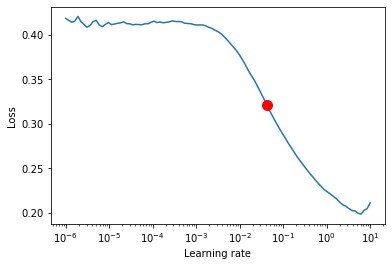

In [ ]:
# find optimal learning rate
res = trainer.tuner.lr_find(
    tft,
    train_dataloader=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
)

print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

# Hyperparameter Tuning

### Weights & Biases Sweep


In [ ]:
wandb.login()

wandb: Currently logged in as: saff (use `wandb login --relogin` to force relogin)


True

In [ ]:
# !wandb agent 

## Train Model

Metrics:   
**RMSE**  
- matches the units of the output.
- Provides an estimate of how large the residuals are being dispersed.  
- Represents the std. deviation of the residuals.

**MAPE**  
- MAE values can range from 0-inf which makes it difficult to interpret result compared to training data.
- Mean Absolute Percentage Error (MAPE) is = to MAE but provides the error in a percentage form.

In [ ]:
# Declare Hyperparameters
config_defaults = {
      "max_epochs": 80, # Lengthened from original
      "attention_head_size": 1,
      "batch_size": batch_size,
      "dropout": 0.1,
      "gradient_clip_val": 0.1,
      "hidden_continuous_size": 8,
      "hidden_size": 16,
      "learning_rate": res.suggestion(),
      "market_count": market_count,
      "property_count": property_count,
      "dataset": market_name,
      "target": col_def['target'],
      "max_prediction_length": max_prediction_length,
      "Pytorch Forecasting version": pytorch_forecasting.__version__
      }

# Change 1.6: Updated this to automatically add the market name as well as Encoder and Prediction Length to notes
run_name = market_name + " 4 (Static Cat)"
notes = "Encoder Length: " + str(max_encoder_length) + "\nPrediction Length: " + str(max_prediction_length) + "\nBaseline: " + str(baseline) + "\nTarget: " + col_def['target'] + "\nAE Outs Ver: " + ae_ver_loaded

wandb.init(config = config_defaults, project = "Scout", entity = "saff", name = run_name, tags=["AE_features", col_def['target'], "New Market Rent Values"],
           notes=notes)# resume=True, id='1nff2xgi' use arguments when you want to resume a specific rn

config = wandb.config

In [ ]:
# configure network and trainer
# Edit the patience to 20 for longer runs default = 10?
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=15, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard
wandb_logger = WandbLogger(project = "Scout", entity = "saff")

trainer = pl.Trainer(
    max_epochs=config.max_epochs,
    gpus=1,
    weights_summary="top",
    gradient_clip_val=config.gradient_clip_val, #0.1,
    limit_train_batches=30,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=wandb_logger,
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate = config.learning_rate,
    hidden_size = config.hidden_size,
    attention_head_size = config.attention_head_size,
    dropout = config.dropout,
    hidden_continuous_size = config.hidden_continuous_size,
    output_size = 7,  #quantiles by default
    loss=QuantileLoss(),
    log_interval = 0,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    reduce_on_plateau_patience = 4,
)

print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

GPU available: True, used: True
TPU available: None, using: 0 TPU cores


Number of parameters in network: 313.3k


In [ ]:
# fit network
wandb_logger.watch(tft)

trainer.fit(
    tft,
    train_dataloader=train_dataloader,
    val_dataloaders=val_dataloader,
)

# save model weights
best_model_path = trainer.checkpoint_callback.best_model_path
wandb.save(best_model_path)

wandb.finish()


   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 275   
3  | prescalers                         | ModuleDict                      | 6.8 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 91.3 K
5  | encoder_variable_selection         | VariableSelectionNetwork        | 204 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 2.6 K 
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            | 1.1 

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")


lr-Ranger,4e-05
_runtime,2742
_timestamp,1616035909
_step,1319
_train_SMAPE_epoch,0.14793
_train_MAE_epoch,0.06587
_train_RMSE_epoch,0.12092
_train_MAPE_epoch,654894.75
train_loss_epoch,0.01924
epoch,43
_val_SMAPE,0.12223


lr-Ranger,███████████████▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_timestamp,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_train_SMAPE_epoch,█▄▃▃▃▃▂▂▂▃▃▂▂▂▃▂▂▂▂▂▃▂▃▂▂▂▁▂▂▂▂▂▂▁▂▂▂▂▂▂
_train_MAE_epoch,█▅▃▂▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_train_RMSE_epoch,█▅▄▂▃▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▂▁▁▂▁▂▂▂▁▁▁▁▁▁▁▁▁▁
_train_MAPE_epoch,█▅▅▃▃▂▂▂▂▂▂▂▂▂▂▂▁▂▁▂▂▁▂▁▁▂▂▁▂▂▂▁▁▁▂▂▁▁▁▁
train_loss_epoch,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
_val_SMAPE,█▅▅▄▁▂▂▄▃▂▃▃▂▁▄▂▁▁▂▂▁▁▂▁▂▂▁▁▂▁▂▂▁▁▁▁▁▁▁▁


## Time Experiment

- Testing the shelf life of data.
- If you train on 12 months, how good is accuracy when predicting the next 12, 18, 24, 30, 36 months
- Testing using the same hparams obv for accurate experiment results.
- Ideal situation is to see a gradual drop off in model performance.

In [ ]:
prediction_length_test = [36]
encoder_length_test = [24]

market_count = len(data['MARKET_NAME'].unique())
property_count = len(data['property_id'].unique())

for encoder_length in encoder_length_test: # ex. train on 12 months, then log a wandb run for each prediction length.

  max_encoder_length = encoder_length

  for prediction_length in prediction_length_test:

    max_prediction_length = prediction_length
    run_name = "encoder: " + str(max_encoder_length) + " | pred_length: " + str(max_prediction_length)

    training_cutoff = data["time_idx"].max() - max_prediction_length

    training = TimeSeriesDataSet(
        data[lambda x: x.time_idx <= training_cutoff],
        time_idx = col_def['time_idx'],
        target = col_def['target'], #Value
        group_ids = col_def['group_ids'],
        min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
        max_encoder_length=max_encoder_length,
        min_prediction_length=1,
        max_prediction_length=max_prediction_length,
        static_categoricals = col_def['static_categoricals'],
        static_reals = col_def['static_reals'],
        time_varying_known_categoricals = col_def['time_varying_known_categoricals'],
        variable_groups = {},  # group of categorical variables can be treated as one variable
        time_varying_known_reals = col_def['time_varying_known_reals'],
        time_varying_unknown_categoricals = [],
        time_varying_unknown_reals = col_def['time_varying_unknown_reals'],
        target_normalizer=GroupNormalizer(
            groups = col_def['group_ids']
        ),  # use softplus with beta=1.0 and normalize by group
        add_relative_time_idx = True,
        add_target_scales = True,
        add_encoder_length = True,
    )

    # create validation set (predict=True) which means to predict the last max_prediction_length points in time for each series
    validation = TimeSeriesDataSet.from_dataset(training, data, predict = True, stop_randomization = True)

    # create dataloaders for model
    batch_size = 32  # set this between 32 to 128
    train_dataloader = training.to_dataloader(train = True, batch_size = batch_size, num_workers = 0)
    val_dataloader = validation.to_dataloader(train = False, batch_size = batch_size * 10, num_workers = 0)

    config_defaults = {
          "max_epochs": 35,
          "attention_head_size": 4,
          "batch_size": batch_size,
          "dropout": 0.2896,
          "gradient_clip_val": 0.4729,
          "hidden_continuous_size": 119,
          "hidden_size": 68,
          "learning_rate": 0.1219,
          "market_count": market_count,
          "property_count": property_count,
          "dataset": load_dataset.dataset_name,
          "target": col_def['target'],
          "max_prediction_length": max_prediction_length,
          "max_encoder_length": max_encoder_length
          }

    # Initialize a new wandb run # entity=“your-team” saff -> to send data to team project
    wandb.init(config = config_defaults, project = "Scout", name = "col_drop_test", entity = "saff") # resume=True, id='2ke1ywm0' use arguments when you want to resume a specific rn

    # Config is a variable that holds and saves hyperparameters and inputs
    config = wandb.config

    early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
    lr_logger = LearningRateMonitor()  # log the learning rate
    wandb_logger = WandbLogger(project = "Scout")

    trainer = pl.Trainer(
        max_epochs = config.max_epochs,
        gpus = 1,
        weights_summary = "top",
        gradient_clip_val = config.gradient_clip_val, #0.1,
        limit_train_batches = 30,  # coment in for training, running valiation every 30 batches
        # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
        callbacks = [lr_logger, early_stop_callback],
        logger = wandb_logger,
    )

    tft = TemporalFusionTransformer.from_dataset(
        training,
        learning_rate = config.learning_rate,
        hidden_size = config.hidden_size,
        attention_head_size = config.attention_head_size,
        dropout = config.dropout,
        hidden_continuous_size = config.hidden_continuous_size,
        output_size = 7,  #quantiles by default
        loss=QuantileLoss(),
        log_interval = 0,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
        reduce_on_plateau_patience = 4,
    )

    trainer.fit(
        tft,
        train_dataloader=train_dataloader,
        val_dataloaders=val_dataloader,
    )

    wandb.finish()

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 72.5 K
3  | prescalers                         | ModuleDict                      | 995 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 120 M 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 9.1 M 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 73.3 K
7  | static_context_variable_selection  | GatedResidualNetwork            | 18.9 K
8  | static_context_initial_hidden_lstm | GatedRe

lr-Ranger,0.00122
_step,689
_runtime,18152
_timestamp,1610137851
val_SMAPE,0.24447
val_MAE,0.20551
val_RMSE,0.38843
val_MAPE,0.23152
val_loss,0.07732
epoch,22
train_SMAPE_epoch,0.24529


lr-Ranger,██████████▂▂▂▂▂▂▂▂▂▁▁▁▁
_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_runtime,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_timestamp,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
val_SMAPE,▁▆▁▃▂▆▃▆▇█▅▃▁▂▂▃▁▂▂▂▂▂▃
val_MAE,▁▆▁▃▂▆▂▆▇█▄▃▁▂▂▃▂▂▂▂▂▂▂
val_RMSE,▁▇▁▄▂▆▂▆▆█▅▃▁▂▂▃▁▂▁▁▁▂▂
val_MAPE,▆▁▄▃▄▄▆▃▆▃▃▄▇▅▅▅█▇██▇▆▆
val_loss,▅█▂▄▂▄▄▃▄▇▄▂▁▂▂▃▂▂▁▁▁▂▁
epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
train_SMAPE_epoch,█▃▃▃▅▅▂█▃▃▅▂▅▅▂▄▄▂▇▅▆▂▁


# Evaluate Performance

- Should log the variable importance on wandb & maybe drop everything that is under 5% importance.
- Maybe drop everything under 10% imporatnce first to drastically affect number of features & see how that affects performance.

## Load model weights & get predictions

### Old methods for loading best model & saving checkpoints to gcs

In [ ]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)

# best_model_path = trainer.checkpoint_callback.best_model_path
# best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

In [ ]:
#save best model in drive (not to train new model every time you run colab)
from shutil import copyfile, move


model_file_name = best_model_path[-22:] # '0.8.1-Rent-Actual.ckpt'
#dest = 'gs://scout-storage/model_checkpoints/' + model_file_name
#dest = '/content/drive/MyDrive/Saf Cap/Scout/model_checkpoints' + model_file_name
#copyfile(best_model_path, dest)

#upload model checkpoint to gcs
blob = bucket.blob('model_checkpoints/' + model_file_name)
# blob.upload_from_filename(best_model_path)

### New method from weights & biases

In [ ]:
wandb.login()

True

In [ ]:
# restore the model file from a specific run
best_model = wandb.restore('epoch=23-step=719.ckpt', run_path="saff/scout/1sg6k8ix")

# use the "name" attribute of the returned object if your framework expects a filename, e.g. as in Keras
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model.name)

ValueError: ignored

In [ ]:
from sklearn.metrics import mean_squared_error
# calcualte error metrics on validation set
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)

MAE = (actuals - predictions).abs().mean()
MSE = mean_squared_error(actuals, predictions, squared=True) #If suqared = True returns MSE value, if False returns RMSE value.
RMSE = mean_squared_error(actuals, predictions, squared=False)

print("MAE: {}\nMSE: {}\nRMSE: {}".format(MAE, MSE, RMSE))

MAE: 0.3104294240474701
MSE: 0.1088046059012413
RMSE: 0.3297404646873474


In [ ]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
#raw_predictions['prediction'][231].tolist() # returns the predictions for group 0 #[0].tolist()

## Output future predictions

In [ ]:
#pd.set_option('display.float_format', lambda x: '%.3f' % x)
#data[['property_id','Price_Per_Unit', 'NOI', 'Market Cap Rate', 'time_idx', 'Value', 'Sales Amount', 'Rent Actual', 'Occupancy Rate', 'Expenses %', 'EGR']][data['property_id'] == '36_1822_32'].tail(n=20)

Criteria goes here
- filter output by property date complete, price per unit, unit count - Done
- Append each properties MAE on the validation set to output - Done
- also need to figure out how to add negative bias - pretty sure done

In [ ]:
prop_data = pd.read_csv('gs://scout-storage/market_fixed_csv/Austin')[['property_id','PROPERTY_DATECOMPLETED',
                                                                       'PROPERTY_UNITS','SUBMARKET_NAME', 'PROPERTY_LATITUDE',
                                                                       'PROPERTY_LONGITUDE', 'PROPERTY_IMPRATING', 'PROPERTY_LOCRATING']].drop_duplicates()

In [ ]:
filters = ['property_id','Rent Per SqFt Market', 'Price_Per_Unit']
aux_data = data[filters][data['time_idx'] == data['time_idx'].max()] #get the last observed rent psf in the market
aux_data = pd.merge(aux_data, prop_data, on='property_id') # join property data to filter by

output = {}
output['property_id'] = data['property_id'].unique() # do something where you number the unique ones and merge with the df_output just to make sure they match
output['MAE'] = []
#Add in column for t+n chosen prediction length
for step in range(max_prediction_length):
  timestep = 't+' + str(step)
  output[timestep] = []

for item in range(len(raw_predictions['groups'])):
  mae_accum = []
  #im guessing out of the quantiles, item 4 (index 3) is the main prediction
  for step in range(max_prediction_length):
    timestep = 't+' + str(step)
    prediction = raw_predictions['prediction'][item][step][3].item()
    actual = x['decoder_target'][item][step].item()
    # negative bias could go here? simply prediction - bias constant since we're looking at the final output list and not the raw predictions only
    output[timestep].append(prediction)
    mae_accum.append(abs((actual - prediction))) #store all MAE values for 1 property over n timesteps

  output['MAE'].append(np.asarray(mae_accum).mean())
  mae_accum.clear() #reset mae_accum

df_output = pd.DataFrame(output)
df_output = pd.merge(df_output, aux_data, on='property_id')

last_timestep = 't+' + str(max_prediction_length-1)
#df_output["Current price delta"] = df_output['t+0'] - df_output['Price_Per_Unit'] #premium that you're giving the owner vs. what they bought it for
df_output['market_rent_delta'] = df_output['Rent Per SqFt Market'] - df_output[last_timestep]  #our forecasted value at last timestep vs last observed purchase price
df_output['future_rent_delta'] = df_output[last_timestep] - df_output['t+0'] #our forecasted value at last timestep vs t+0's valuation.

#since we're not predicting market rent yet, rank to see which properties have the least amount of change in the future relative to current market rents.
df_output = df_output.sort_values(by=['market_rent_delta'], ascending=False, na_position='last').reset_index()

In [ ]:
# filters
df_output.loc[(df_output['MAE'] < 0.05) &
              (df_output['PROPERTY_DATECOMPLETED'] < 2000) &
              (df_output['Price_Per_Unit'] < 150000) &
              (df_output['PROPERTY_UNITS'] > 150)
              ]

,index,property_id,MAE,t+0,t+1,t+2,t+3,t+4,t+5,t+6,...,Price_Per_Unit,PROPERTY_DATECOMPLETED,PROPERTY_UNITS,SUBMARKET_NAME,PROPERTY_LATITUDE,PROPERTY_LONGITUDE,PROPERTY_IMPRATING,PROPERTY_LOCRATING,market_rent_delta,future_rent_delta


In [ ]:
data[['property_id', 'time_idx', 'Rent Per SqFt Actual', 'Rent Per SqFt Market', 'Rent Actual']][data['property_id'] == '36_1508_09'].tail(n=5)

,property_id,time_idx,Rent Per SqFt Actual,Rent Per SqFt Market,Rent Actual


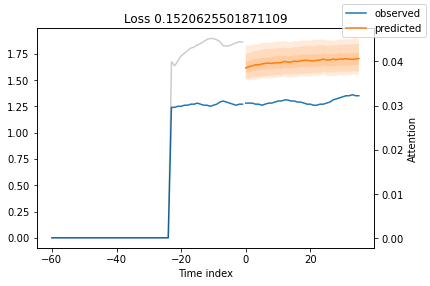

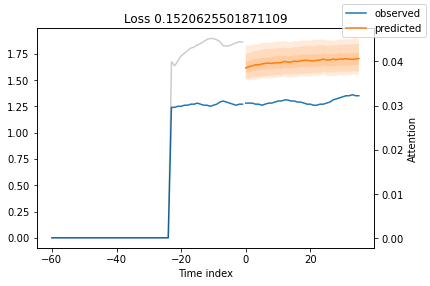

In [ ]:
#PROPERTY_DATECOMPLETED is probably the most important feature affecting results
best_tft.plot_prediction(x, raw_predictions, idx=139, add_loss_to_title=True)

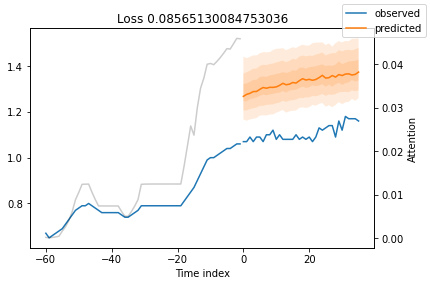

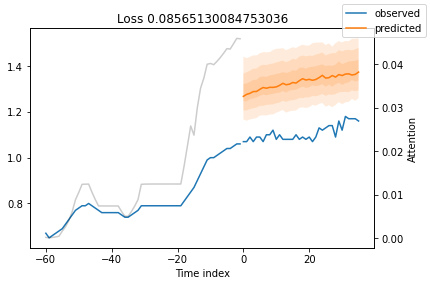

In [ ]:
# plot a single property - DONT TOUCH
best_tft.plot_prediction(x, raw_predictions, idx=239, add_loss_to_title=True)

In [ ]:
df_output.loc[df_output['property_id'] == '36_1822_32'] #River Stone Ranch

,index,property_id,MAE,t+0,t+1,t+2,t+3,t+4,t+5,t+6,...,Price_Per_Unit,PROPERTY_DATECOMPLETED,PROPERTY_UNITS,SUBMARKET_NAME,PROPERTY_LATITUDE,PROPERTY_LONGITUDE,PROPERTY_IMPRATING,PROPERTY_LOCRATING,market_rent_delta,future_rent_delta


In [ ]:
#The test - DONT TOUCH
df_output.loc[df_output['property_id'] == '36_1822_32'] #River Stone Ranch

,index,property_id,MAE,t+0,t+1,t+2,t+3,t+4,t+5,t+6,...,Price_Per_Unit,PROPERTY_DATECOMPLETED,PROPERTY_UNITS,SUBMARKET_NAME,PROPERTY_LATITUDE,PROPERTY_LONGITUDE,PROPERTY_IMPRATING,PROPERTY_LOCRATING,market_rent_delta,future_rent_delta


Error: ignored

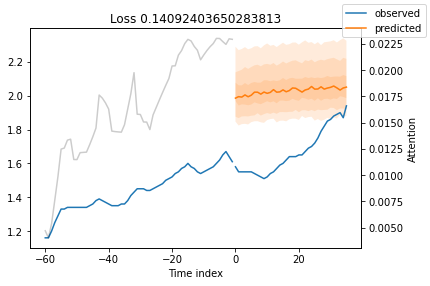

In [ ]:
for idx in range(10):  # log 10 predictions to to w&b
  chart_name = data['property_id'].unique()[idx]
  plt = best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);
  wandb.log({chart_name: plt})

##Variable Importance

In [ ]:
 # resume=True, id='1nff2xgi'
 #wandb.init(config = config_defaults, project = "Scout", resume=True, id='1nff2xgi', entity = "saff")
 #wandb.finish()

In [ ]:
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")

In [ ]:
#variable importance
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")

def get_top_features(best_tft, interpretation, percent_trim):
  '''Return top x% of features by importance'''

  def trim_list(array, percentage):
    """Trim the bottom n% of a list (assuming descending order)"""
    trim = int(len(array) * (percentage/100))
    return array[:-trim]

  def var_importance(values, labels):
    """Output dict of variable labels & values in descending order of importance"""
    order = np.argsort(values)
    output = np.asarray(labels)[order]
    return list(reversed(output))

  static_variables = interpretation['static_variables']
  static_labels = best_tft.static_variables

  encoder_variables = interpretation['encoder_variables']
  encoder_labels = best_tft.encoder_variables

  decoder_variables = interpretation['decoder_variables']
  decoder_labels = best_tft.decoder_variables

  #print(len(var_importance(static_variables, labels))) #length of the important vars list
  #print(var_importance(static_variables, labels)) #look at the list

  #features trimmed
  encoder_drops = trim_list(var_importance(encoder_variables, encoder_labels), percent_trim)
  decoder_drops = trim_list(var_importance(decoder_variables, decoder_labels), percent_trim)
  static_drops = trim_list(var_importance(static_variables, static_labels), percent_trim)

  top_features = encoder_drops + decoder_drops + static_drops

  return top_features

top_features = get_top_features(best_tft, interpretation, 25)

In [ ]:
import json
feature_list = {'features':top_features}

# 'gs://scout-storage/model_tuning/top_features.json'

blob = bucket.blob('model_tuning/top_features_75.json')

blob.upload_from_string(
   data=json.dumps(feature_list),
   content_type='application/json'
 )

# test = bucket.get_blob('model_tuning/top_features.json')
# fileData = json.loads(test.download_as_string())

In [ ]:
# plot variable importance to wandb
import matplotlib.pyplot as plt
def make_selection_plot(title, values, labels):
  fig, ax = plt.subplots(figsize=(7, len(values) * 0.25 + 2))
  order = np.argsort(values)
  values = values / values.sum(-1).unsqueeze(-1)
  ax.barh(np.arange(len(values)), values[order] * 100, tick_label=np.asarray(labels)[order])
  ax.set_title(title)
  ax.set_xlabel("Importance in %")
  plt.tight_layout()
  return fig

var_importance_plot = make_selection_plot("Variables importance", encoder_variables, labels)
#wandb.log({"Variable Importance": var_importance_plot})

NameError: ignored

## Plot prediction by variables

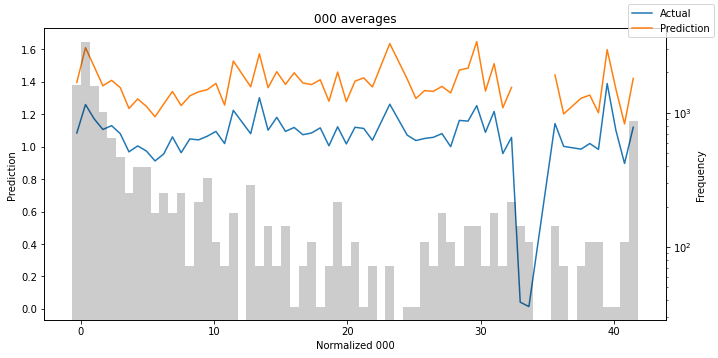

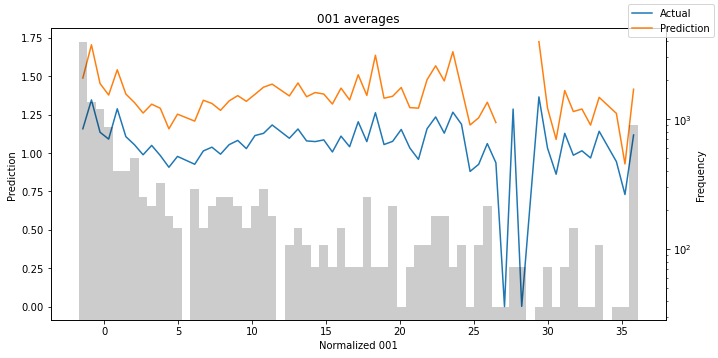

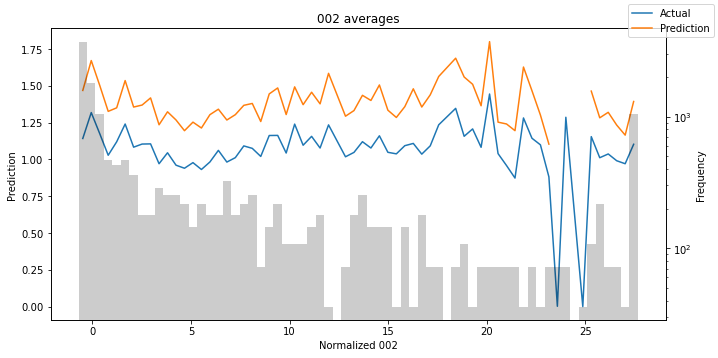

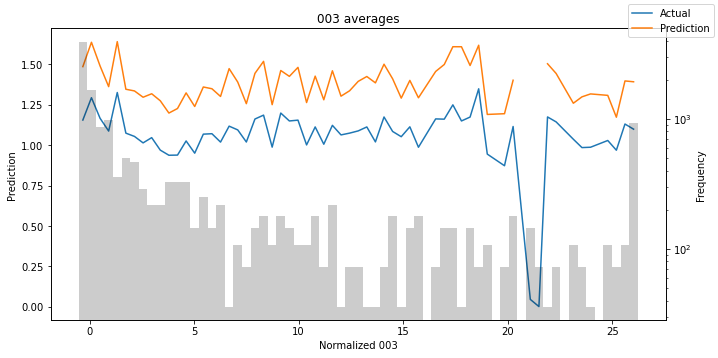

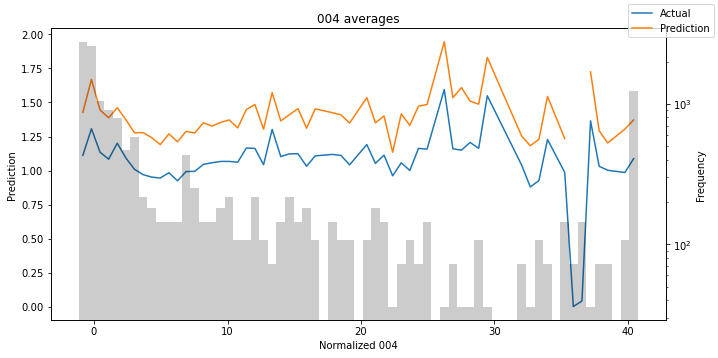

...

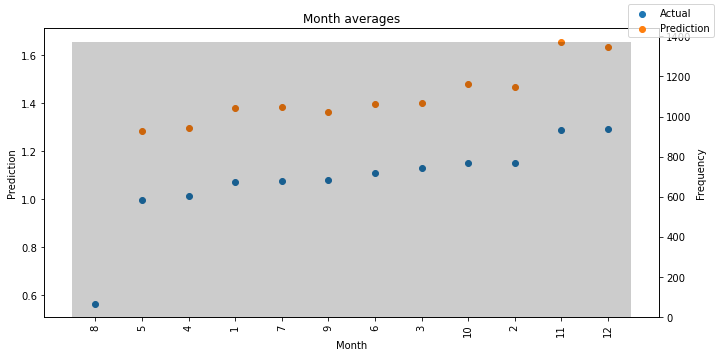

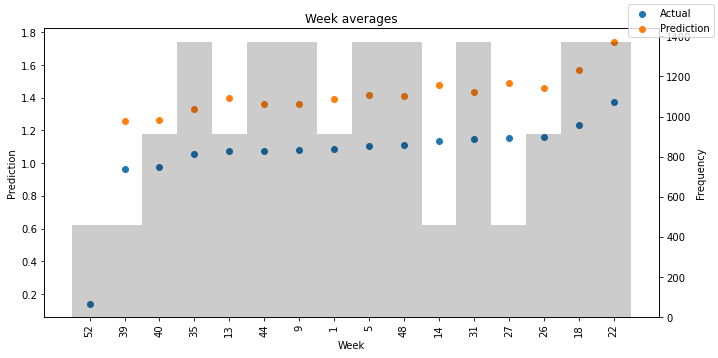

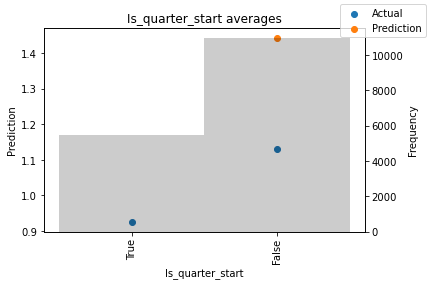

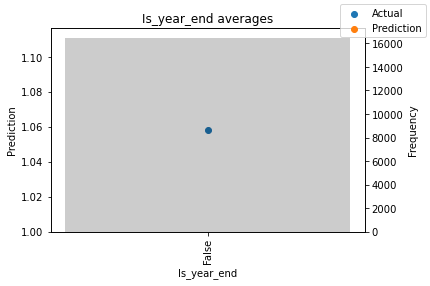

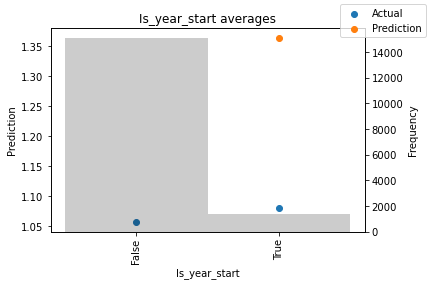

In [ ]:
# plot prediction by variable
predictions, x = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);